<a href="https://colab.research.google.com/github/Annasha-dot/Credit_card_fraud_detection/blob/main/Credit_card_fraud_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Import Libraries

In [54]:
#Basic imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

#Models imports
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor

#Machine Learning dataset imports
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

#Understanding Dataset
1. Read data
2. Check sample data
3. Understand the column types
4. Check statistical data

In [55]:
# Read data
credit_card_df = pd.read_csv('creditcard.csv')

In [56]:
# Check sample data
credit_card_df.head(15)

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0
5,2.0,-0.425966,0.960523,1.141109,-0.168252,0.420987,-0.029728,0.476201,0.260314,-0.568671,...,-0.208254,-0.559825,-0.026398,-0.371427,-0.232794,0.105915,0.253844,0.081080,3.67,0
6,4.0,1.229658,0.141004,0.045371,1.202613,0.191881,0.272708,-0.005159,0.081213,0.464960,...,-0.167716,-0.270710,-0.154104,-0.780055,0.750137,-0.257237,0.034507,0.005168,4.99,0
7,7.0,-0.644269,1.417964,1.074380,-0.492199,0.948934,0.428118,1.120631,-3.807864,0.615375,...,1.943465,-1.015455,0.057504,-0.649709,-0.415267,-0.051634,-1.206921,-1.085339,40.80,0
8,7.0,-0.894286,0.286157,-0.113192,-0.271526,2.669599,3.721818,0.370145,0.851084,-0.392048,...,-0.073425,-0.268092,-0.204233,1.011592,0.373205,-0.384157,0.011747,0.142404,93.20,0
9,9.0,-0.338262,1.119593,1.044367,-0.222187,0.499361,-0.246761,0.651583,0.069539,-0.736727,...,-0.246914,-0.633753,-0.120794,-0.385050,-0.069733,0.094199,0.246219,0.083076,3.68,0


In [57]:
#Shape of the dataset used
credit_card_df.shape

(284807, 31)

In [58]:
# Understand the columns
credit_card_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28

In [59]:
# Statistical information
credit_card_df.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.000000,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,...,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000,284807.000000
mean,94813.859575,1.168375e-15,3.416908e-16,-1.379537e-15,2.074095e-15,9.604066e-16,1.487313e-15,-5.556467e-16,1.213481e-16,-2.406331e-15,...,1.654067e-16,-3.568593e-16,2.578648e-16,4.473266e-15,5.340915e-16,1.683437e-15,-3.660091e-16,-1.227390e-16,88.349619,0.001727
std,47488.145955,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,1.098632e+00,...,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01,250.120109,0.041527
min,0.000000,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,...,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,0.000000,0.000000
25%,54201.500000,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,...,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,5.600000,0.000000
50%,84692.000000,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,...,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,22.000000,0.000000
75%,139320.500000,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,5.971390e-01,...,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,77.165000,0.000000
max,172792.000000,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,...,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01,25691.160000,1.000000


#Pre-processing
1. Check and process null values
2. Check and process duplicated values

In [60]:
# Check null values
credit_card_df.isnull().sum()

,0
Time,0
V1,0
V2,0
V3,0
V4,0
V5,0
V6,0
V7,0
V8,0
V9,0


There are no null values in the dataset.

In [61]:
# Check duplicated values
credit_card_df.duplicated().sum()

np.int64(1081)

In [62]:
# Checking the duplicated rows
credit_card_df[credit_card_df.duplicated()]

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
33,26.0,-0.529912,0.873892,1.347247,0.145457,0.414209,0.100223,0.711206,0.176066,-0.286717,...,0.046949,0.208105,-0.185548,0.001031,0.098816,-0.552904,-0.073288,0.023307,6.14,0
35,26.0,-0.535388,0.865268,1.351076,0.147575,0.433680,0.086983,0.693039,0.179742,-0.285642,...,0.049526,0.206537,-0.187108,0.000753,0.098117,-0.553471,-0.078306,0.025427,1.77,0
113,74.0,1.038370,0.127486,0.184456,1.109950,0.441699,0.945283,-0.036715,0.350995,0.118950,...,0.102520,0.605089,0.023092,-0.626463,0.479120,-0.166937,0.081247,0.001192,1.18,0
114,74.0,1.038370,0.127486,0.184456,1.109950,0.441699,0.945283,-0.036715,0.350995,0.118950,...,0.102520,0.605089,0.023092,-0.626463,0.479120,-0.166937,0.081247,0.001192,1.18,0
115,74.0,1.038370,0.127486,0.184456,1.109950,0.441699,0.945283,-0.036715,0.350995,0.118950,...,0.102520,0.605089,0.023092,-0.626463,0.479120,-0.166937,0.081247,0.001192,1.18,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
282987,171288.0,1.912550,-0.455240,-1.750654,0.454324,2.089130,4.160019,-0.881302,1.081750,1.022928,...,-0.524067,-1.337510,0.473943,0.616683,-0.283548,-1.084843,0.073133,-0.036020,11.99,0
283483,171627.0,-1.464380,1.368119,0.815992,-0.601282,-0.689115,-0.487154,-0.303778,0.884953,0.054065,...,0.287217,0.947825,-0.218773,0.082926,0.044127,0.639270,0.213565,0.119251,6.82,0
283485,171627.0,-1.457978,1.378203,0.811515,-0.603760,-0.711883,-0.471672,-0.282535,0.880654,0.052808,...,0.284205,0.949659,-0.216949,0.083250,0.044944,0.639933,0.219432,0.116772,11.93,0
284191,172233.0,-2.667936,3.160505,-3.355984,1.007845,-0.377397,-0.109730,-0.667233,2.309700,-1.639306,...,0.391483,0.266536,-0.079853,-0.096395,0.086719,-0.451128,-1.183743,-0.222200,55.66,0


In [63]:
# Drop duplicated rows
credit_card_df.drop_duplicates(inplace=True)

print("Duplicate rows : ", credit_card_df.duplicated().sum())
print ("Shape of dataset : ", credit_card_df.shape)

Duplicate rows :  0
Shape of dataset :  (283726, 31)


There were 1081 duplicate values. Dropped the duplicated rows.

#EDA
1. Scaling the required columns
2. Check and process imbalance in dataset
3. Understand the fraudulant and normal dataset

Scaling the required rows : As described in the dataset, the 'V' features are scaled as PCA was performed on them. Only 'Time' and 'Amount' column is not scaled. So, Scaling these 2 features using StandardScalar.

/tmp/ipython-input-583174436.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(credit_card_df['Amount'], kde=True, ax=axes[0,0])
/tmp/ipython-input-583174436.py:7: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(credit_card_df['Time'], kde=True, ax=axes[0,1])
/tmp/ipython-input-583174436.py:9: U

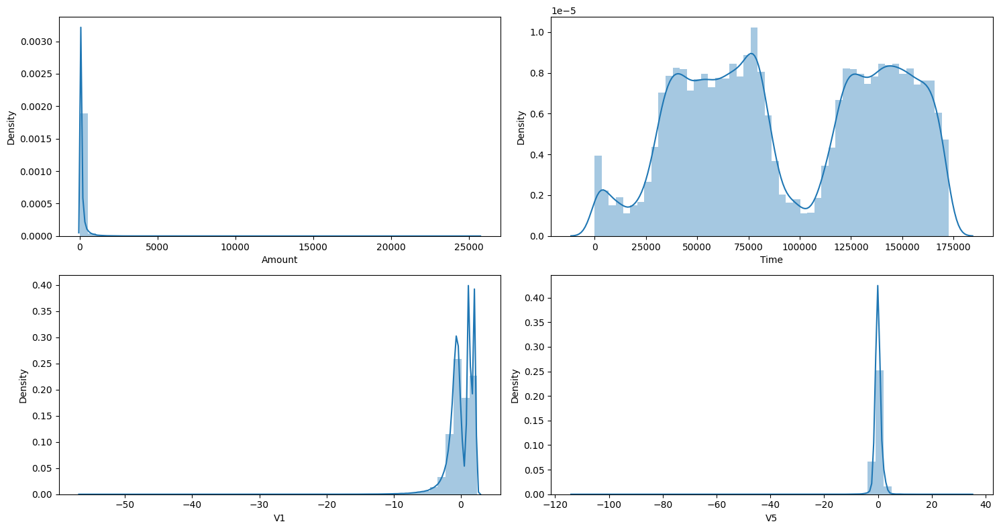

In [64]:
#Check the distribution of the data before Scaling

fig, axes = plt.subplots(2, 2, figsize=(15, 8))

sns.distplot(credit_card_df['Amount'], kde=True, ax=axes[0,0])

sns.distplot(credit_card_df['Time'], kde=True, ax=axes[0,1])

sns.distplot(credit_card_df['V1'], kde=True, ax=axes[1,0])

sns.distplot(credit_card_df['V5'], kde=True, ax=axes[1,1])

plt.tight_layout()
plt.show()

In [65]:
#Scaling amount and time

scaler = StandardScaler()

credit_card_df['Amount_scaled'] = scaler.fit_transform(credit_card_df['Amount'].values.reshape(-1, 1))
credit_card_df['Time_scaled'] = scaler.fit_transform(credit_card_df['Time'].values.reshape(-1, 1))

credit_card_df.drop(['Time', 'Amount'], axis=1, inplace=True)
credit_card_df.head(15)

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V22,V23,V24,V25,V26,V27,V28,Class,Amount_scaled,Time_scaled
0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,...,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,0,0.244200,-1.996823
1,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,...,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,0,-0.342584,-1.996823
2,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,...,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,0,1.158900,-1.996802
3,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,...,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,0,0.139886,-1.996802
4,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,...,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,0,-0.073813,-1.996781
5,-0.425966,0.960523,1.141109,-0.168252,0.420987,-0.029728,0.476201,0.260314,-0.568671,-0.371407,...,-0.559825,-0.026398,-0.371427,-0.232794,0.105915,0.253844,0.081080,0,-0.338670,-1.996781
6,1.229658,0.141004,0.045371,1.202613,0.191881,0.272708,-0.005159,0.081213,0.464960,-0.099254,...,-0.270710,-0.154104,-0.780055,0.750137,-0.257237,0.034507,0.005168,0,-0.333399,-1.996739
7,-0.644269,1.417964,1.074380,-0.492199,0.948934,0.428118,1.120631,-3.807864,0.615375,1.249376,...,-1.015455,0.057504,-0.649709,-0.415267,-0.051634,-1.206921,-1.085339,0,-0.190387,-1.996675
8,-0.894286,0.286157,-0.113192,-0.271526,2.669599,3.721818,0.370145,0.851084,-0.392048,-0.410430,...,-0.268092,-0.204233,1.011592,0.373205,-0.384157,0.011747,0.142404,0,0.018879,-1.996675
9,-0.338262,1.119593,1.044367,-0.222187,0.499361,-0.246761,0.651583,0.069539,-0.736727,-0.366846,...,-0.633753,-0.120794,-0.385050,-0.069733,0.094199,0.246219,0.083076,0,-0.338630,-1.996633


/tmp/ipython-input-2800240571.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(credit_card_df['Amount_scaled'], kde=True, ax=axes[0,0])
/tmp/ipython-input-2800240571.py:7: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(credit_card_df['Time_scaled'], kde=True, ax=axes[0,1])
/tmp/ipython-input-2

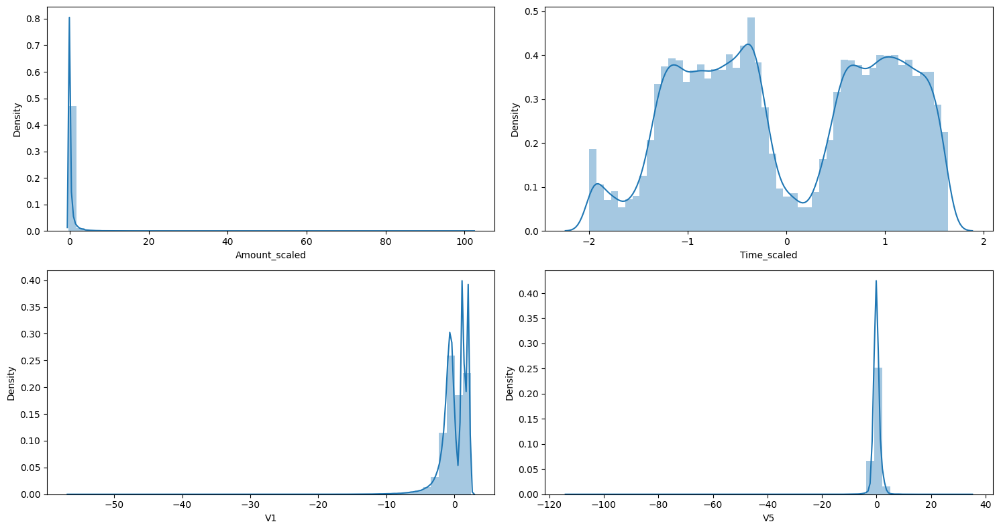

In [66]:
#Checking the distribution of data after Scaling

fig, axes = plt.subplots(2, 2, figsize=(15, 8))

sns.distplot(credit_card_df['Amount_scaled'], kde=True, ax=axes[0,0])

sns.distplot(credit_card_df['Time_scaled'], kde=True, ax=axes[0,1])

sns.distplot(credit_card_df['V1'], kde=True, ax=axes[1,0])

sns.distplot(credit_card_df['V5'], kde=True, ax=axes[1,1])

plt.tight_layout()
plt.show()

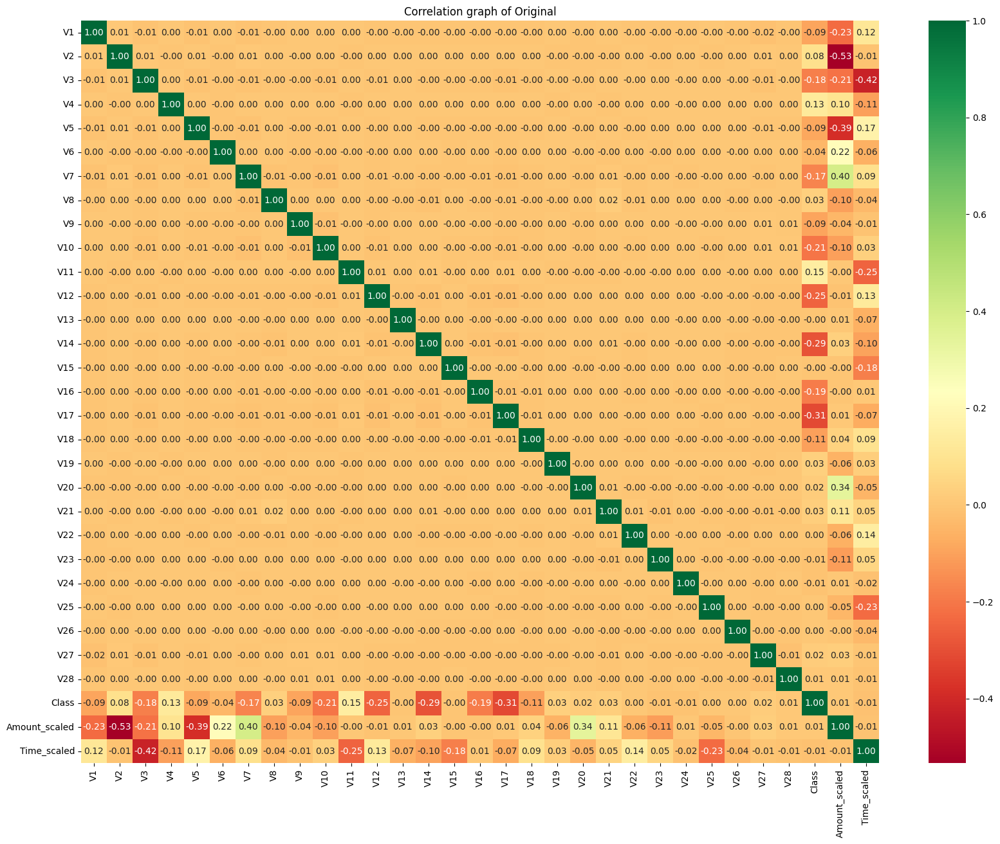

In [67]:
#Checking the correlation for various columns in original dataset

corr = credit_card_df.corr()
fig, ax = plt.subplots(figsize=(20,15))
sns.heatmap(corr,cmap='RdYlGn',annot=True,fmt=".2f",ax=ax)
plt.title("Correlation graph of Original")

plt.show()

In [68]:
#Checking the imbalance of the dataset
credit_card_count = pd.DataFrame()
credit_card_count['Class_count'] = credit_card_df['Class'].value_counts()
credit_card_count['Class_count_percent'] = (credit_card_count['Class_count']/credit_card_count['Class_count'].sum())*100
credit_card_count

,Class_count,Class_count_percent
Class,,
0,283253,99.83329
1,473,0.16671


<Axes: xlabel='Class', ylabel='count'>

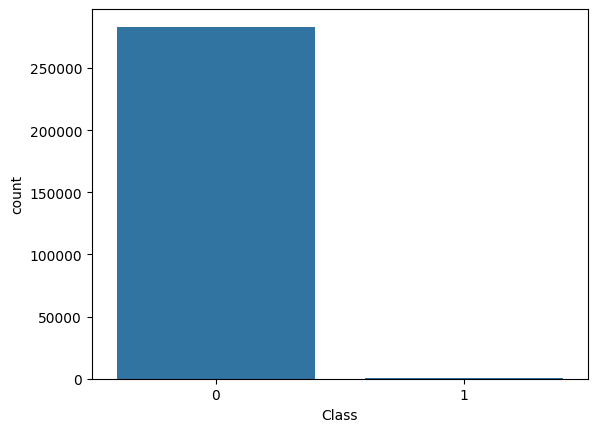

In [69]:
sns.countplot(x='Class', data=credit_card_df)

The dataset is highly imbalanced with 99.83% of data labelled as normal transaction and only 0.16% data labelled as fraudulant transaction.

In [70]:
#Analysing Fraud and Normal data

normal_df = credit_card_df[credit_card_df['Class']==0]
fraud_df = credit_card_df[credit_card_df['Class']==1]

print(normal_df.shape, fraud_df.shape)

(283253, 31) (473, 31)


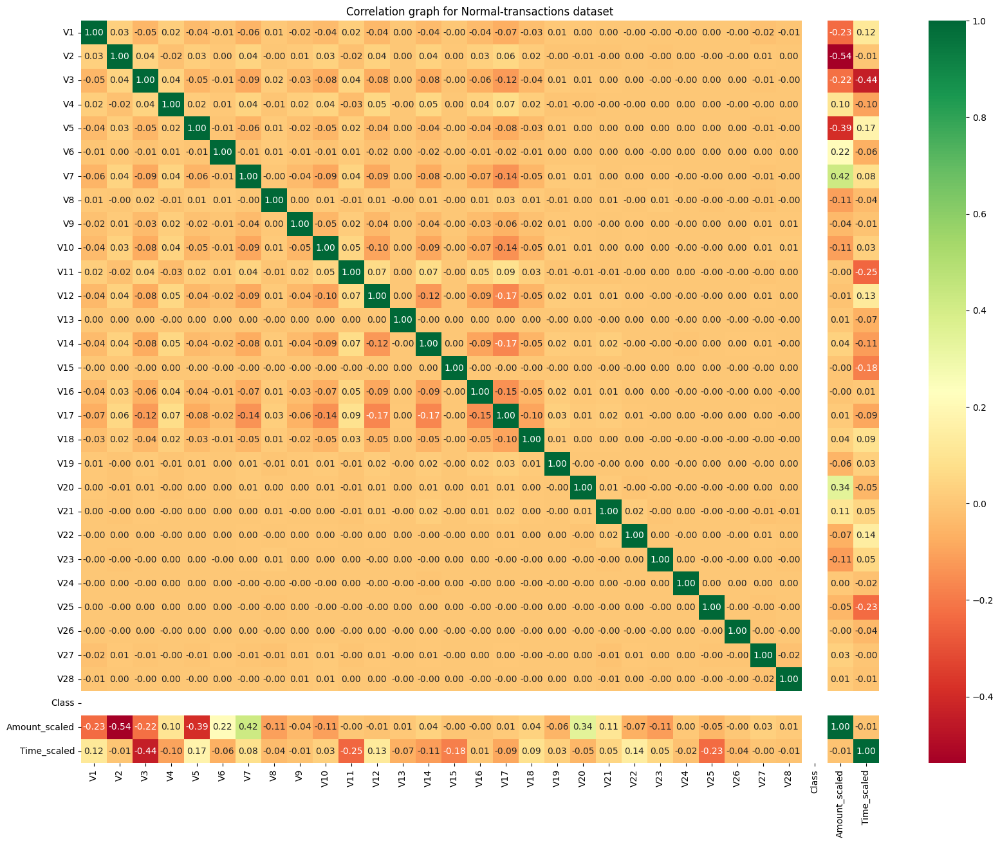

In [71]:
#Correlation matrix of Normal transactions only
corr = normal_df.corr()
fig, ax = plt.subplots(figsize=(20,15))
sns.heatmap(corr,cmap='RdYlGn',annot=True,fmt=".2f",ax=ax)
plt.title("Correlation graph for Normal-transactions dataset")

plt.show()

In [72]:
#Checking the fraud values
fraud_df.head(15)

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V22,V23,V24,V25,V26,V27,V28,Class,Amount_scaled,Time_scaled
541,-2.312227,1.951992,-1.609851,3.997906,-0.522188,-1.426545,-2.537387,1.391657,-2.770089,-2.772272,...,-0.035049,-0.465211,0.320198,0.044519,0.177840,0.261145,-0.143276,1,-0.353327,-1.988272
623,-3.043541,-3.157307,1.088463,2.288644,1.359805,-1.064823,0.325574,-0.067794,-0.270953,-0.838587,...,0.435477,1.375966,-0.293803,0.279798,-0.145362,-0.252773,0.035764,1,1.759301,-1.986882
4920,-2.303350,1.759247,-0.359745,2.330243,-0.821628,-0.075788,0.562320,-0.399147,-0.238253,-1.525412,...,-0.932391,0.172726,-0.087330,-0.156114,-0.542628,0.039566,-0.153029,1,0.604864,-1.902848
6108,-4.397974,1.358367,-2.592844,2.679787,-1.128131,-1.706536,-3.496197,-0.248778,-0.247768,-4.801637,...,0.176968,-0.436207,-0.053502,0.252405,-0.657488,-0.827136,0.849573,1,-0.117703,-1.849690
6329,1.234235,3.019740,-4.304597,4.732795,3.624201,-1.357746,1.713445,-0.496358,-1.282858,-2.447469,...,-0.704181,-0.656805,-1.632653,1.488901,0.566797,-0.010016,0.146793,1,-0.349333,-1.838465
6331,0.008430,4.137837,-6.240697,6.675732,0.768307,-3.353060,-1.631735,0.154612,-2.795892,-6.187891,...,-0.608057,-0.539528,0.128940,1.488481,0.507963,0.735822,0.513574,1,-0.349333,-1.838317
6334,0.026779,4.132464,-6.560600,6.348557,1.329666,-2.513479,-1.689102,0.303253,-3.139409,-6.045468,...,-0.576752,-0.669605,-0.759908,1.605056,0.540675,0.737040,0.496699,1,-0.349333,-1.838128
6336,0.329594,3.712889,-5.775935,6.078266,1.667359,-2.420168,-0.812891,0.133080,-2.214311,-5.134454,...,-0.652450,-0.551572,-0.716522,1.415717,0.555265,0.530507,0.404474,1,-0.349333,-1.837959
6338,0.316459,3.809076,-5.615159,6.047445,1.554026,-2.651353,-0.746579,0.055586,-2.678679,-4.959493,...,-0.511747,-0.583813,-0.219845,1.474753,0.491192,0.518868,0.402528,1,-0.349333,-1.837791
6427,0.725646,2.300894,-5.329976,4.007683,-1.730411,-1.732193,-3.968593,1.063728,-0.486097,-4.624985,...,0.109541,0.601045,-0.364700,-1.843078,0.351909,0.594550,0.099372,1,-0.349333,-1.836548


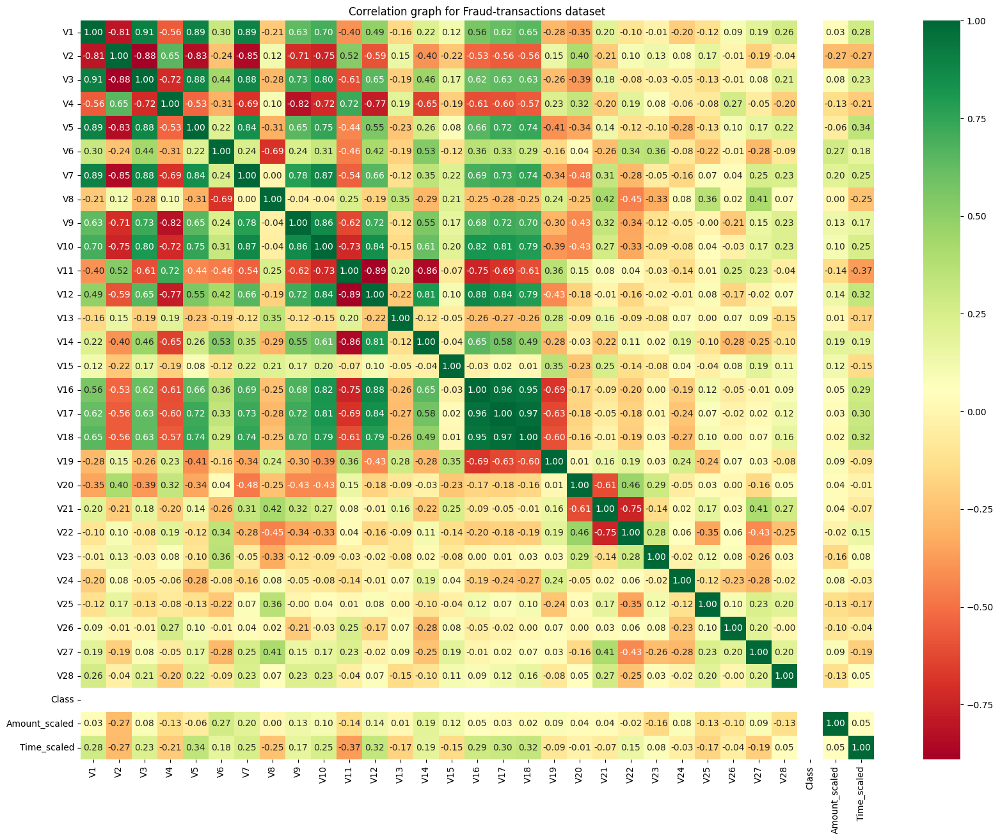

In [73]:
#Correlation Matrix of Fraud data only.
corr = fraud_df.corr()
fig, ax = plt.subplots(figsize=(20,15))
sns.heatmap(corr,cmap='RdYlGn',annot=True,fmt=".2f",ax=ax)
plt.title("Correlation graph for Fraud-transactions dataset")

plt.show()

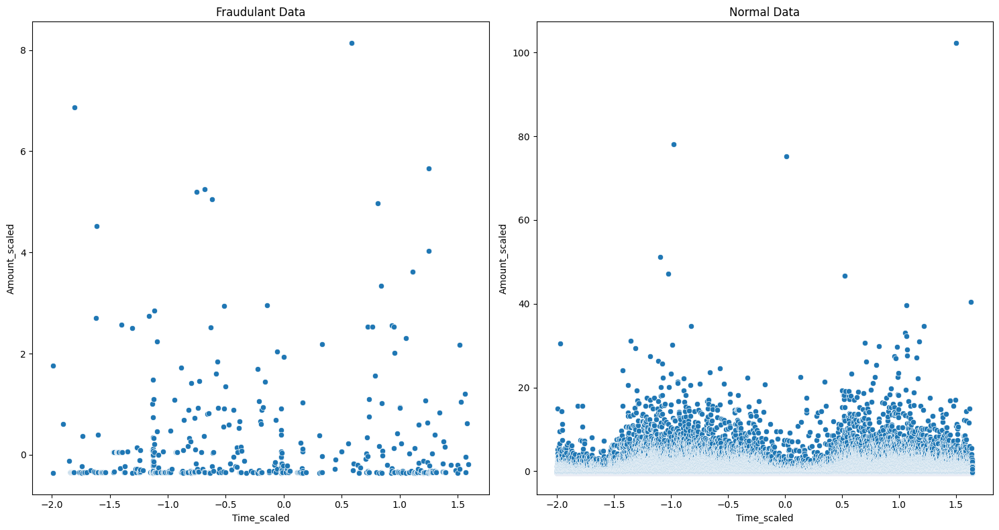

In [74]:
#Plot normal data and fradulant data with time
fig, axes = plt.subplots(1, 2, figsize=(15, 8))

sns.scatterplot(x='Time_scaled', y='Amount_scaled', data=fraud_df, ax=axes[0])
axes[0].set_title('Fraudulant Data')

sns.scatterplot(x='Time_scaled', y='Amount_scaled', data=normal_df, ax=axes[1])
axes[1].set_title('Normal Data')

plt.tight_layout()
plt.show()

In [110]:
sns.pairplot(fraud_df)

#Dealing with Imbalanced Data
1. Check the size of imbalanced data
2. Sample out the dataset to balance it
3. Check the correlation graph

In [76]:
credit_card_df['Class'].value_counts()

,count
Class,
0,283253
1,473


Thus, in the given dataset we have 473 fraudulent transactions and 283253 normal transactions. The dataset is highly imbalanced.
To balance it, we will create a new dataset with equal or slightly greater proportion of normal and fraud values.

In [77]:
#Deep copy of the original dataset into a new dataset.
import copy
credit_card_new =copy.deepcopy( credit_card_df)

credit_card_new.head(15)

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V22,V23,V24,V25,V26,V27,V28,Class,Amount_scaled,Time_scaled
0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,...,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,0,0.244200,-1.996823
1,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,...,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,0,-0.342584,-1.996823
2,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,...,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,0,1.158900,-1.996802
3,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,...,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,0,0.139886,-1.996802
4,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,...,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,0,-0.073813,-1.996781
5,-0.425966,0.960523,1.141109,-0.168252,0.420987,-0.029728,0.476201,0.260314,-0.568671,-0.371407,...,-0.559825,-0.026398,-0.371427,-0.232794,0.105915,0.253844,0.081080,0,-0.338670,-1.996781
6,1.229658,0.141004,0.045371,1.202613,0.191881,0.272708,-0.005159,0.081213,0.464960,-0.099254,...,-0.270710,-0.154104,-0.780055,0.750137,-0.257237,0.034507,0.005168,0,-0.333399,-1.996739
7,-0.644269,1.417964,1.074380,-0.492199,0.948934,0.428118,1.120631,-3.807864,0.615375,1.249376,...,-1.015455,0.057504,-0.649709,-0.415267,-0.051634,-1.206921,-1.085339,0,-0.190387,-1.996675
8,-0.894286,0.286157,-0.113192,-0.271526,2.669599,3.721818,0.370145,0.851084,-0.392048,-0.410430,...,-0.268092,-0.204233,1.011592,0.373205,-0.384157,0.011747,0.142404,0,0.018879,-1.996675
9,-0.338262,1.119593,1.044367,-0.222187,0.499361,-0.246761,0.651583,0.069539,-0.736727,-0.366846,...,-0.633753,-0.120794,-0.385050,-0.069733,0.094199,0.246219,0.083076,0,-0.338630,-1.996633


In [78]:
#We will keep all fraud transactions and 1000 normal transactions
fraud_df_new = credit_card_new[credit_card_new['Class']==1]
normal_df_new = credit_card_new[credit_card_new['Class']==0][:1000]

credit_card_new = pd.concat([fraud_df_new, normal_df_new])
credit_card_new.shape

(1473, 31)

In [79]:
#Shuffle the new dataset
credit_card_new = credit_card_new.sample(frac=1, random_state=42)
credit_card_new.sample(15)

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V22,V23,V24,V25,V26,V27,V28,Class,Amount_scaled,Time_scaled
147,0.607153,-0.957413,0.761505,1.590050,-1.177298,0.011232,-0.166991,0.152720,0.742860,-0.151018,...,0.100682,-0.317001,0.543778,0.484232,-0.330425,-0.001545,0.062098,0,0.720080,-1.994885
225,-2.687978,4.390230,-2.360483,0.360829,1.310192,-1.645253,2.327776,-1.727825,4.324752,6.286487,...,-0.156951,0.079854,-0.012598,0.207194,-0.536578,0.950393,-0.624431,0,-0.349773,-1.993727
18773,0.269614,3.549755,-5.810353,5.809370,1.538808,-2.269219,-0.824203,0.351070,-3.759059,-4.592390,...,-0.322290,-0.549856,-0.520629,1.378210,0.564714,0.553255,0.402400,1,-0.350611,-1.370193
44270,-20.906908,9.843153,-19.947726,6.155789,-15.142013,-2.239566,-21.234463,1.151795,-8.739670,-18.271168,...,0.652932,-0.519777,0.541702,-0.053861,0.112671,-3.765371,-1.071238,1,-0.349333,-1.114996
220725,-1.169203,1.863414,-2.515135,5.463681,-0.297971,1.364918,0.759219,-0.118861,-2.293921,-0.423784,...,-0.708692,0.471309,-0.078616,-0.544655,0.014777,-0.240930,-0.781055,1,0.942964,0.999746
70,1.006589,-0.071105,0.347614,1.329684,-0.193240,0.155418,0.008574,0.146538,0.103844,0.031830,...,-0.018881,-0.120966,0.027382,0.593864,-0.334688,0.021368,0.015080,0,-0.081880,-1.995854
73,-0.580629,0.482684,1.333123,-0.253080,-0.028469,-0.519166,0.503249,0.117773,0.117112,-0.420488,...,-0.148707,0.001451,0.302764,-0.680714,-0.015554,-0.006307,0.164222,0,-0.266825,-1.995812
83053,0.326007,1.286638,-2.007181,2.419675,-1.532902,-1.432803,-2.459530,0.617738,-1.125861,-3.236784,...,0.169776,-0.174357,0.308061,0.710996,-0.231030,0.580495,0.300984,1,-0.328287,-0.740130
742,1.135721,0.185328,0.532581,1.474706,-0.335261,-0.372402,0.059040,-0.019913,0.313131,-0.117886,...,-0.022336,-0.020836,0.413028,0.608604,-0.332335,0.037787,0.019238,0,-0.307600,-1.985092
45,1.138316,0.056956,0.649419,0.873062,-0.468466,-0.410195,-0.013898,-0.072440,0.306788,-0.269953,...,-0.247401,0.059405,0.456286,0.361004,0.274414,-0.002498,0.017109,0,-0.268103,-1.996107


In [80]:
credit_card_new['Class'].value_counts()

,count
Class,
0,1000
1,473


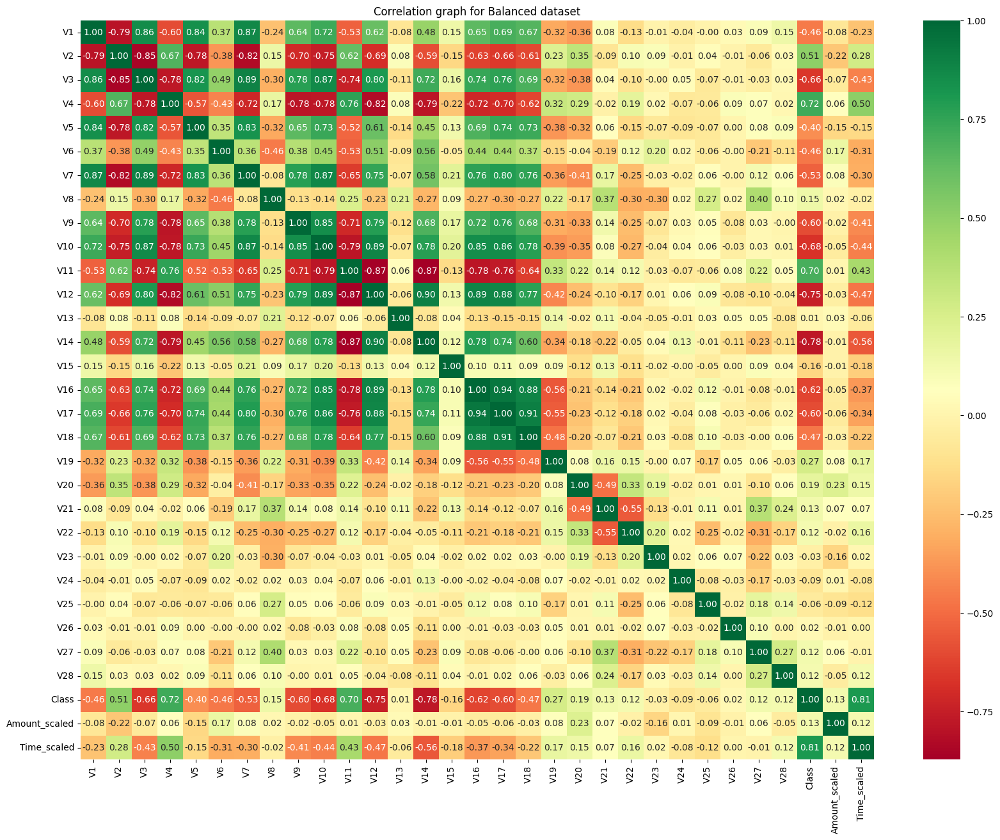

In [81]:
corr = credit_card_new.corr()
fig, ax = plt.subplots(figsize=(20,15))
sns.heatmap(corr,cmap='RdYlGn',annot=True,fmt=".2f",ax=ax)
plt.title("Correlation graph for Balanced dataset")

plt.show()

#Model Training for both original and balanced dataset
1. Split the dataset into dependent and independent columns
2. Train-test split
3. Train and execute models
    1. Logistic Regression
    2. Decision Tree
    3. Random Forest
    4. XgBoost
    5. Isolated Forest
    6. Local Outlier Factor

In [82]:
#Dataset split for original dataset
X = credit_card_df.drop('Class', axis=1)
y = credit_card_df['Class']

print(X.shape)
print(y.shape)

(283726, 30)
(283726,)


In [83]:
#Dataset split for balanced dataset
X_baln = credit_card_new.drop('Class', axis=1)
y_baln = credit_card_new['Class']

print(X_baln.shape)
print(y_baln.shape)

(1473, 30)
(1473,)


In [84]:
#Train-test split for original dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print("X_train : ", X_train.shape)
print("X_test : ", X_test.shape)
print("y_train : ", y_train.shape)
print("y_test : ", y_test.shape)

X_train :  (226980, 30)
X_test :  (56746, 30)
y_train :  (226980,)
y_test :  (56746,)


In [85]:
#Train-test split for balanced dataset
X_train_baln, X_test_baln, y_train_baln, y_test_baln = train_test_split(X_baln, y_baln, test_size=0.2, random_state=42)

print("X_train : ", X_train_baln.shape)
print("X_test : ", X_test_baln.shape)
print("y_train : ", y_train_baln.shape)
print("y_test : ", y_test_baln.shape)

X_train :  (1178, 30)
X_test :  (295, 30)
y_train :  (1178,)
y_test :  (295,)


In [86]:
#Logistic Regression on original dataset
log_reg = LogisticRegression()

log_reg.fit(X, y)
y_pred_lr = log_reg.predict(X_test)

accuracy_score_lr = accuracy_score(y_test, y_pred_lr)
print("Accuracy Score : ", accuracy_score_lr)

recall_score_lr = recall_score(y_test, y_pred_lr)
print("Recall Score : ", recall_score_lr)

f1_score_lr = f1_score(y_test, y_pred_lr)
print("F1 Score : ", f1_score_lr)

Accuracy Score :  0.9992246149508336
Recall Score :  0.5777777777777777
F1 Score :  0.7027027027027027


In [87]:
#Logistic Regression on Balanced dataset

log_reg.fit(X_baln, y_baln)
y_baln_pred_lr = log_reg.predict(X_test_baln)

accuracy_score_baln_lr = accuracy_score(y_test_baln, y_baln_pred_lr)
print("Accuracy Score : ", accuracy_score_baln_lr)

recall_score_lr_baln = recall_score(y_test_baln, y_baln_pred_lr)
print("Recall Score : ", recall_score_lr_baln)

f1_score_lr_baln = f1_score(y_test_baln, y_baln_pred_lr)
print("F1 Score : ", f1_score_lr_baln)

Accuracy Score :  1.0
Recall Score :  1.0
F1 Score :  1.0


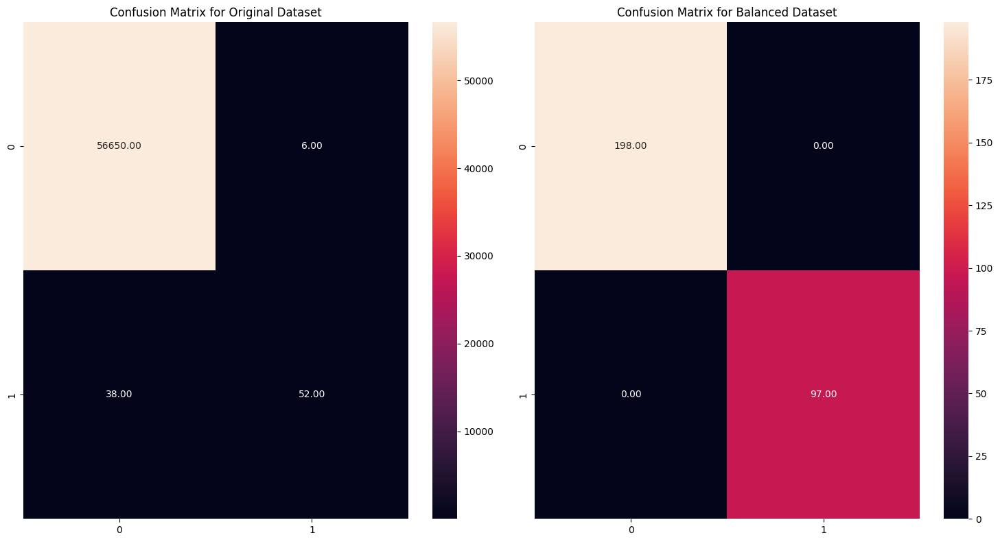

In [88]:
#Compare the Confusion matrix for original and balanced dataset

cm_original = confusion_matrix(y_test, y_pred_lr)
cm_balanced = confusion_matrix(y_test_baln, y_baln_pred_lr)

fig, ax = plt.subplots(1,2 , figsize=(15,8))
sns.heatmap(cm_original,annot=True,fmt=".2f",ax=ax[0])
ax[0].set_title('Confusion Matrix for Original Dataset')

sns.heatmap(cm_balanced,annot=True,fmt=".2f",ax=ax[1])
ax[1].set_title('Confusion Matrix for Balanced Dataset')

plt.tight_layout()
plt.show()

In [89]:
#Decision Tree with original dataset
dt = DecisionTreeClassifier(max_depth=10)
dt.fit(X_train, y_train)
y_pred_dt = dt.predict(X_test)

accuracy_score_dt = accuracy_score(y_test, y_pred_dt)
print("Accuracy Score : ", accuracy_score_dt)

recall_score_dt = recall_score(y_test, y_pred_dt)
print("Recall Score : ", recall_score_dt)

f1_score_dt = f1_score(y_test, y_pred_dt)
print("F1 Score : ", f1_score_dt)

Accuracy Score :  0.9994184612131252
Recall Score :  0.7222222222222222
F1 Score :  0.7975460122699386


In [90]:
#Decision Tree with balanced dataset
dt.fit(X_train_baln, y_train_baln)
y_baln_pred_dt = dt.predict(X_test_baln)

accuracy_score_baln_dt = accuracy_score(y_test_baln, y_baln_pred_dt)
print("Accuracy Score : ", accuracy_score_baln_dt)

recall_score_dt_baln = recall_score(y_test_baln, y_baln_pred_dt)
print("Recall Score : ", recall_score_dt_baln)

f1_score_dt_baln = f1_score(y_test_baln, y_baln_pred_dt)
print("F1 Score : ", f1_score_dt_baln)

Accuracy Score :  0.9932203389830508
Recall Score :  1.0
F1 Score :  0.9897959183673469


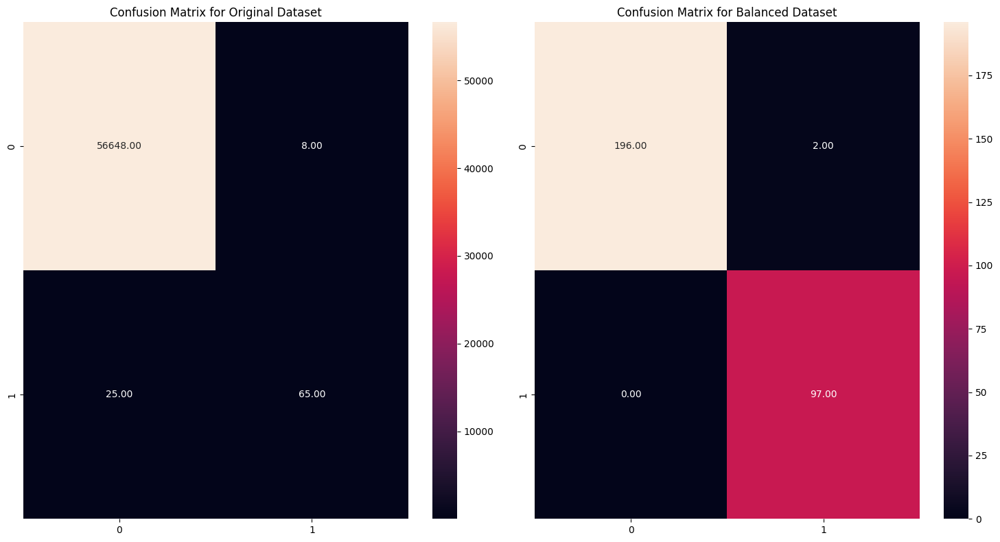

In [91]:
#Compare the Confusion matrix for original and balanced dataset

cm_original = confusion_matrix(y_test, y_pred_dt)
cm_balanced = confusion_matrix(y_test_baln, y_baln_pred_dt)

fig, ax = plt.subplots(1,2 , figsize=(15,8))
sns.heatmap(cm_original,annot=True,fmt=".2f",ax=ax[0])
ax[0].set_title('Confusion Matrix for Original Dataset')

sns.heatmap(cm_balanced,annot=True,fmt=".2f",ax=ax[1])
ax[1].set_title('Confusion Matrix for Balanced Dataset')

plt.tight_layout()
plt.show()

In [92]:
#Random Forest with original dataset
rf = RandomForestClassifier()
rf.fit(X_train, y_train)
y_pred_rf = rf.predict(X_test)

accuracy_score_rf = accuracy_score(y_test, y_pred_rf)
print("Accuracy Score : ", accuracy_score_rf)

recall_score_rf = recall_score(y_test, y_pred_rf)
print("Recall Score : ", recall_score_rf)

f1_score_rf = f1_score(y_test, y_pred_rf)
print("F1 Score : ", f1_score_rf)

Accuracy Score :  0.9995241955380115
Recall Score :  0.7333333333333333
F1 Score :  0.8301886792452831


In [93]:
#Random Forest with balanced dataset
rf.fit(X_train_baln, y_train_baln)
y_baln_pred_rf = rf.predict(X_test_baln)

accuracy_score_baln_rf = accuracy_score(y_test_baln, y_baln_pred_rf)
print("Accuracy Score : ", accuracy_score_baln_rf)

recall_score_rf_baln = recall_score(y_test_baln, y_baln_pred_rf)
print("Recall Score : ", recall_score_rf_baln)

f1_score_rf_baln = f1_score(y_test_baln, y_baln_pred_rf)
print("F1 Score : ", f1_score_rf_baln)

Accuracy Score :  1.0
Recall Score :  1.0
F1 Score :  1.0


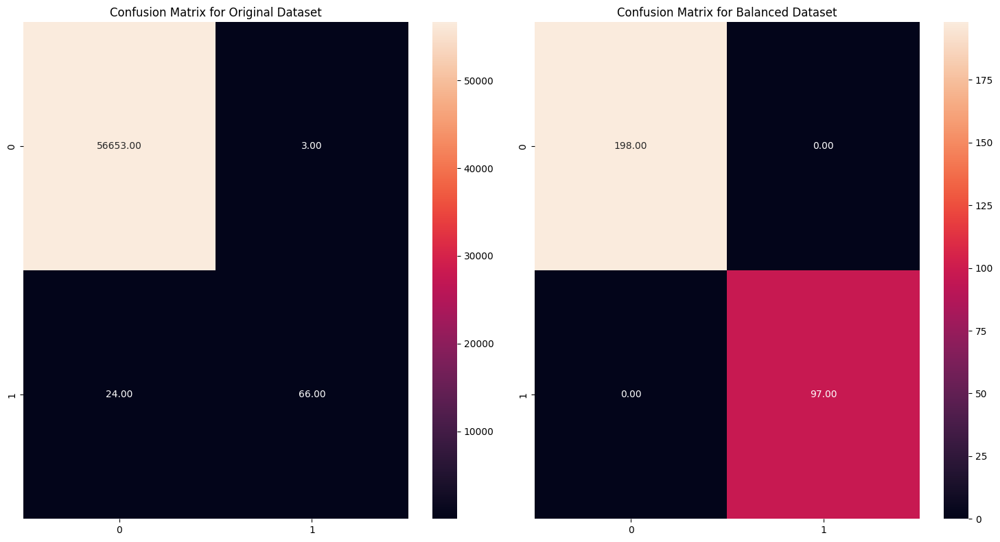

In [94]:
#Compare the Confusion matrix for original and balanced dataset

cm_original = confusion_matrix(y_test, y_pred_rf)
cm_balanced = confusion_matrix(y_test_baln, y_baln_pred_rf)

fig, ax = plt.subplots(1,2 , figsize=(15,8))
sns.heatmap(cm_original,annot=True,fmt=".2f",ax=ax[0])
ax[0].set_title('Confusion Matrix for Original Dataset')

sns.heatmap(cm_balanced,annot=True,fmt=".2f",ax=ax[1])
ax[1].set_title('Confusion Matrix for Balanced Dataset')

plt.tight_layout()
plt.show()

In [95]:
#XgBoost with original dataset

xgb = XGBClassifier()
xgb.fit(X_train, y_train)
y_pred_xgb = xgb.predict(X_test)

accuracy_score_xgb = accuracy_score(y_test, y_pred_xgb)
print("Accuracy Score : ", accuracy_score_xgb)

recall_score_xgb = recall_score(y_test, y_pred_xgb)
print("Recall Score : ", recall_score_xgb)

f1_score_xgb = f1_score(y_test, y_pred_xgb)
print("F1 Score : ", f1_score_xgb)

Accuracy Score :  0.9994184612131252
Recall Score :  0.7111111111111111
F1 Score :  0.7950310559006211


In [96]:
#XgBoost with balanced data

xgb.fit(X_train_baln, y_train_baln)
y_baln_pred_xgb = xgb.predict(X_test_baln)

accuracy_score_baln_xgb = accuracy_score(y_test_baln, y_baln_pred_xgb)
print("Accuracy Score : ", accuracy_score_baln_xgb)

recall_score_xgb_baln = recall_score(y_test_baln, y_baln_pred_xgb)
print("Recall Score : ", recall_score_xgb_baln)

f1_score_xgb_baln = f1_score(y_test_baln, y_baln_pred_xgb)
print("F1 Score : ", f1_score_xgb_baln)

Accuracy Score :  1.0
Recall Score :  1.0
F1 Score :  1.0


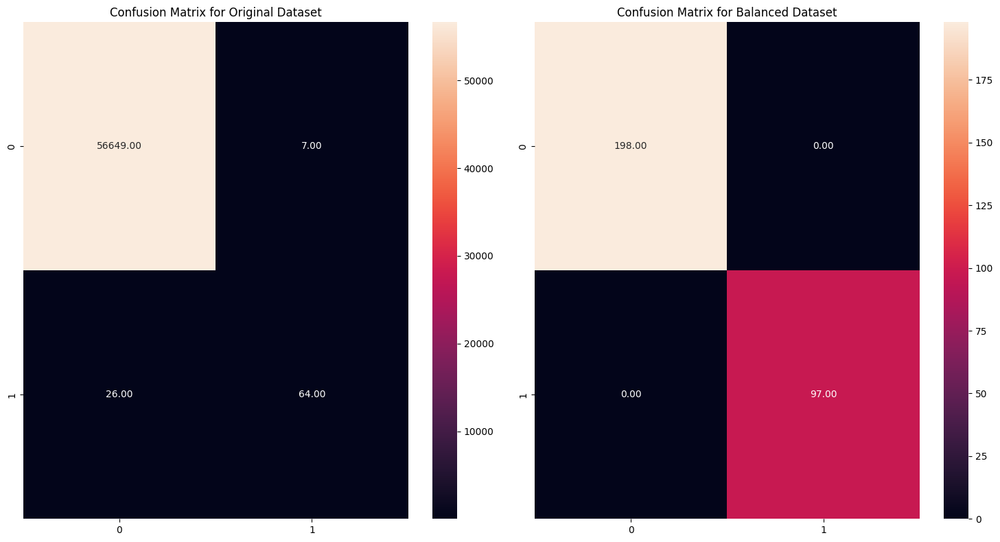

In [97]:
#Compare the Confusion matrix for original and balanced dataset

cm_original = confusion_matrix(y_test, y_pred_xgb)
cm_balanced = confusion_matrix(y_test_baln, y_baln_pred_xgb)

fig, ax = plt.subplots(1,2 , figsize=(15,8))
sns.heatmap(cm_original,annot=True,fmt=".2f",ax=ax[0])
ax[0].set_title('Confusion Matrix for Original Dataset')

sns.heatmap(cm_balanced,annot=True,fmt=".2f",ax=ax[1])
ax[1].set_title('Confusion Matrix for Balanced Dataset')

plt.tight_layout()
plt.show()

In [98]:
#Isolated Forest with original data
iso_forest = IsolationForest(n_estimators=100, random_state=42)
iso_forest.fit(X_train)
y_pred_iso = iso_forest.predict(X_test)
print(y_pred_iso)
y_pred_iso = np.where(y_pred_iso == 1, 0, 1)
print(y_pred_iso)

accuracy_score_iso = accuracy_score(y_test, y_pred_iso)
print("Accuracy Score : ", accuracy_score_iso)

recall_score_iso = recall_score(y_test, y_pred_iso)
print("Recall Score : ", recall_score_iso)

f1_score_iso = f1_score(y_test, y_pred_iso)
print("F1 Score : ", f1_score_iso)

[1 1 1 ... 1 1 1]
[0 0 0 ... 0 0 0]
Accuracy Score :  0.9638564832763543
Recall Score :  0.7555555555555555
F1 Score :  0.06218564243255601


In [99]:
#Isolated Forest with balanced data
iso_forest.fit(X_train_baln)
y_pred_iso_baln = iso_forest.predict(X_test_baln)
print(y_pred_iso_baln)
y_pred_iso_baln = np.where(y_pred_iso_baln == 1, 0, 1)
print(y_pred_iso_baln)

accuracy_score_iso_baln = accuracy_score(y_test_baln, y_pred_iso_baln)
print("Accuracy Score : ", accuracy_score_iso_baln)

recall_score_iso_baln = recall_score(y_test_baln, y_pred_iso_baln)
print("Recall Score : ", recall_score_iso_baln)

f1_score_iso_baln = f1_score(y_test_baln, y_pred_iso_baln)
print("F1 Score : ", f1_score_iso_baln)

[ 1 -1  1  1  1  1  1  1 -1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1 -1  1  1  1  1  1  1  1  1  1
  1 -1 -1  1  1  1 -1  1  1  1 -1  1  1  1  1  1  1  1  1  1  1  1 -1  1
  1  1  1 -1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1 -1  1  1  1  1  1  1 -1  1  1  1  1  1  1  1  1  1  1 -1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1 -1  1 -1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1 -1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
 -1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1 -1  1  1  1  1  1  1  1 -1  1 -1 -1  1  1  1
 -1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1 -1  1  1  1  1
  1  1  1  1  1  1  1]
[0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 1

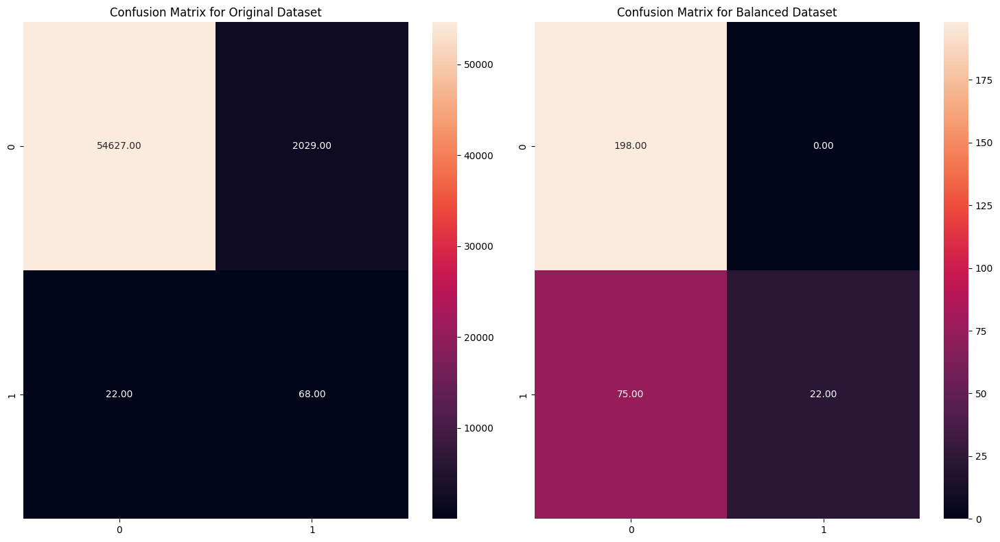

In [100]:
#Compare the Confusion matrix for original and balanced dataset

cm_original = confusion_matrix(y_test, y_pred_iso)
cm_balanced = confusion_matrix(y_test_baln, y_pred_iso_baln)

fig, ax = plt.subplots(1,2 , figsize=(15,8))
sns.heatmap(cm_original,annot=True,fmt=".2f",ax=ax[0])
ax[0].set_title('Confusion Matrix for Original Dataset')

sns.heatmap(cm_balanced,annot=True,fmt=".2f",ax=ax[1])
ax[1].set_title('Confusion Matrix for Balanced Dataset')

plt.tight_layout()
plt.show()

In [101]:
#Local Outlier Factor for original dataset
lof = LocalOutlierFactor(n_neighbors=20, contamination=0.1)
lof.fit_predict(X_train)
y_pred_lof = lof.fit_predict(X_test)
print(y_pred_lof)
y_pred_lof = np.where(y_pred_lof == 1, 0, 1)
print(y_pred_lof)

accuracy_score_lof = accuracy_score(y_test, y_pred_lof)
print("Accuracy Score : ", accuracy_score_lof)

recall_score_lof = recall_score(y_test, y_pred_lof)
print("Recall Score : ", recall_score_lof)

f1_score_lof = f1_score(y_test, y_pred_lof)
print("F1 Score : ", f1_score_lof)

[1 1 1 ... 1 1 1]
[0 0 0 ... 0 0 0]
Accuracy Score :  0.8991118316709548
Recall Score :  0.2222222222222222
F1 Score :  0.006938421509106678


In [103]:
 #Local Outlier Factor for balanced dataset
lof.fit(X_train_baln)
y_pred_lof_baln = lof.fit_predict(X_test_baln)
print(y_pred_lof_baln)
y_pred_lof_baln = np.where(y_pred_lof_baln == 1, 0, 1)
print(y_pred_lof_baln)

accuracy_score_lof_baln = accuracy_score(y_test_baln, y_pred_lof_baln)
print("Accuracy Score : ", accuracy_score_lof_baln)

recall_score_lof_baln = recall_score(y_test_baln, y_pred_lof_baln)
print("Recall Score : ", recall_score_lof_baln)

f1_score_lof_bal = f1_score(y_test_baln, y_pred_lof_baln)
print("F1 Score : ", f1_score_lof_bal)

[ 1  1  1  1  1  1  1  1  1  1  1  1 -1  1  1  1  1 -1  1  1 -1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1 -1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1 -1  1 -1  1  1  1 -1  1 -1  1  1  1  1  1  1
  1  1 -1  1  1  1 -1  1 -1 -1  1  1  1  1  1  1 -1  1  1 -1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1 -1  1  1 -1  1 -1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1 -1  1  1  1  1  1 -1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1 -1  1  1  1  1  1  1  1  1  1 -1  1  1  1  1 -1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1 -1
 -1  1 -1  1  1  1  1  1  1  1  1  1  1  1  1  1  1 -1  1 -1  1  1 -1  1
  1  1  1  1  1  1  1  1  1 -1  1  1  1  1  1  1  1  1  1  1  1  1  1 -1
  1  1  1  1  1  1  1]
[0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 0

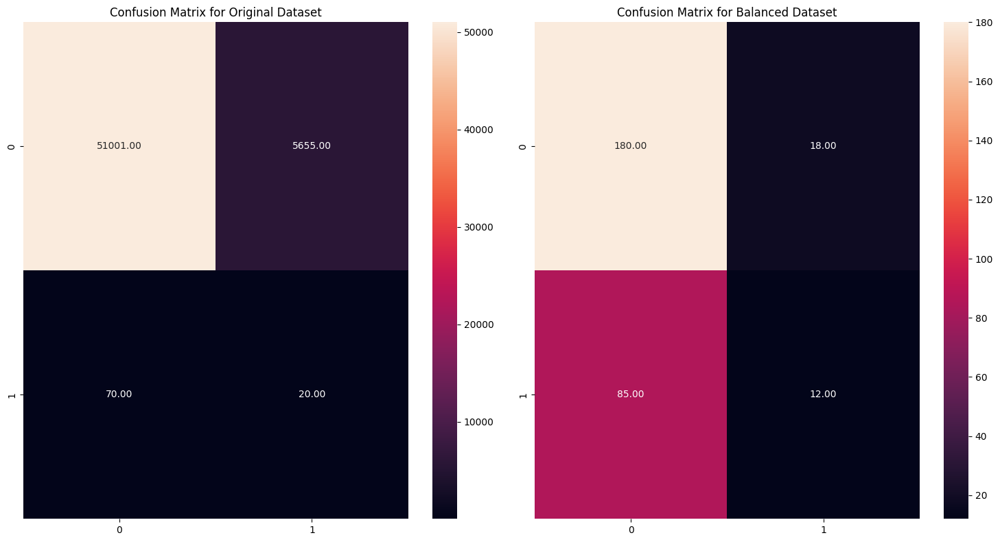

In [104]:
#Compare the Confusion matrix for original and balanced dataset

cm_original = confusion_matrix(y_test, y_pred_lof)
cm_balanced = confusion_matrix(y_test_baln, y_pred_lof_baln)

fig, ax = plt.subplots(1,2 , figsize=(15,8))
sns.heatmap(cm_original,annot=True,fmt=".2f",ax=ax[0])
ax[0].set_title('Confusion Matrix for Original Dataset')

sns.heatmap(cm_balanced,annot=True,fmt=".2f",ax=ax[1])
ax[1].set_title('Confusion Matrix for Balanced Dataset')

plt.tight_layout()
plt.show()

#Final Output

In [107]:
final_df = pd.DataFrame()
final_df['Model'] = ['Logistic Regression', 'Decision Tree', 'Random Forest', 'XgBoost', 'Isolated Forest', 'Local Outlier Factor']
final_df['Accuracy Score'] = [accuracy_score_lr, accuracy_score_dt, accuracy_score_rf, accuracy_score_xgb, accuracy_score_iso, accuracy_score_lof]
final_df['Recall Score'] = [recall_score_lr, recall_score_dt, recall_score_rf, recall_score_xgb, recall_score_iso, recall_score_lof]
final_df['F1 Score'] = [f1_score_lr, f1_score_dt, f1_score_rf, f1_score_xgb, f1_score_iso, f1_score_lof]
final_df['Accuracy Score (Balanced)'] = [accuracy_score_baln_lr, accuracy_score_baln_dt, accuracy_score_baln_rf, accuracy_score_baln_xgb, accuracy_score_iso_baln, accuracy_score_lof_baln]
final_df['Recall score (Balanced)'] = [recall_score_lr_baln, recall_score_dt_baln, recall_score_rf_baln, recall_score_xgb_baln, recall_score_iso_baln, recall_score_lof_baln]
final_df['F1 Score (Balanced)'] = [f1_score_lr_baln, f1_score_dt_baln, f1_score_rf_baln, f1_score_xgb_baln, f1_score_iso_baln, f1_score_lof_bal]

final_df

,Model,Accuracy Score,Recall Score,F1 Score,Accuracy Score (Balanced),Recall score (Balanced),F1 Score (Balanced)
0,Logistic Regression,0.999225,0.577778,0.702703,1.000000,1.000000,1.000000
1,Decision Tree,0.999418,0.722222,0.797546,0.993220,1.000000,0.989796
2,Random Forest,0.999524,0.733333,0.830189,1.000000,1.000000,1.000000
3,XgBoost,0.999418,0.711111,0.795031,1.000000,1.000000,1.000000
4,Isolated Forest,0.963856,0.755556,0.062186,0.745763,0.226804,0.369748
5,Local Outlier Factor,0.899112,0.222222,0.006938,0.650847,0.123711,0.188976


Compared multiple supervised and anomaly detection models. Used F1-score and Recall as key metrics since catching fraud (reducing false negatives). They are more critical than overall accuracy.

-> Accuracy tells nothing valuable (a model can be 99% accurate and still miss fraud).

-> Recall is critical → ensures fraud cases are caught.

-> F1-score is a balanced measure to compare models, since we want both high recall and decent precision.

**Random Forest** is the best model in this scenerio with **83% F1-score** and **73% Recall value**.